In [7]:
import matplotlib.pyplot as plt
from matplotlib.image import imread
import scanpy as sc
import numpy as np
import pandas as pd
#import cv2
import math
from pathlib import Path, PurePath
from scipy.spatial import distance
from scipy.ndimage import gaussian_filter
from typing import Union, Dict, Optional, Tuple, BinaryIO
import json

from PIL import Image

In [8]:
def QC(tissue_dir):
    metafile = None
    adata1 = sc.read_visium(tissue_dir) 
    
    adata1.var_names_make_unique() 
    #sc.pp.normalize_total(adata1, inplace=True) 
    sc.pp.log1p(adata1)
    adata1.obs['n_counts'] = adata1.X.sum(axis=1).A1
    sc.pl.spatial(adata1, img_key="hires", color='n_counts', alpha=0.7, cmap='jet')

    return adata1

In [9]:
plt.rc('font', size = 15)

## chlamidia

/home/seohyepark/yes/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/seohyepark/yes/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


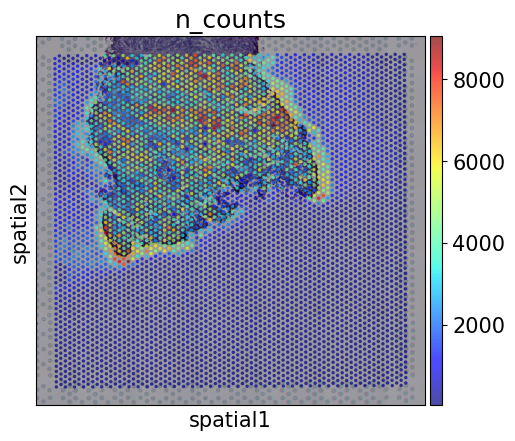

In [11]:
tissue_dir = '/home/seohyepark/portrai-nadim/2831300_Tumor_microbiome/28313000_Tumor_16S_rRNA_Chlamydia'
adata = QC(tissue_dir)

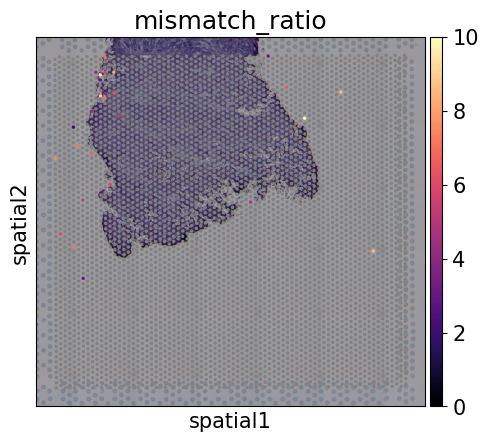

In [12]:
df = pd.read_csv('/home/seohyepark/portrai-nadim/28313000_Tumor_microbiome/barcode_summary_Chlamydia.csv', index_col = 0)

adata.obs['all_RNA_reads'] = df['l2']
adata.obs['mean_num_of_mismatches'] = df['l3']

adata.obs['mismatch_ratio'] = adata.obs['mean_num_of_mismatches'] / adata.obs['all_RNA_reads']

adata.obs['mismatch_ratio'].replace([np.inf, -np.inf], np.nan, inplace=True)
adata.obs['mismatch_ratio'].fillna(-1, inplace=True)

cmap = plt.cm.magma# You can choose any other colormap
cmap.set_under('gray')  # Setting the color for -1 values

sc.pl.spatial(adata, color='mismatch_ratio', save = '.png', cmap=cmap,  vmax = 10, vmin=0)

import matplotlib.pyplot as plt
import scanpy as sc

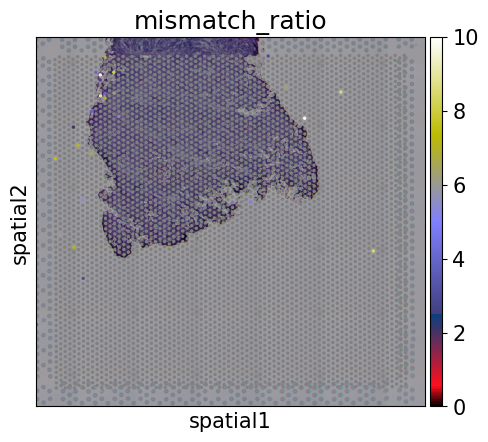

In [13]:
import matplotlib.pyplot as plt
import scanpy as sc

# Your existing code for creating the plot
adata.obs['mismatch_ratio'] = adata.obs['mean_num_of_mismatches'] / adata.obs['all_RNA_reads']
adata.obs['mismatch_ratio'].replace([np.inf, -np.inf], np.nan, inplace=True)
adata.obs['mismatch_ratio'].fillna(-1, inplace=True)

cmap = plt.cm.gist_stern  # You can choose any other colormap
cmap.set_under('gray')  # Setting the color for -1 values

# Create the plot
sc.pl.spatial(adata, color='mismatch_ratio', cmap=cmap, vmax = 10, vmin=0, show=False)

# Save the figure in high resolution
plt.savefig('spatial_plot.png', dpi=300)  # 300 dpi is typically considered high resolution


In [14]:
adata.obs['mismatch_ratio'] = adata.obs['mean_num_of_mismatches'] / adata.obs['all_RNA_reads']
adata.obs['mismatch_ratio'].replace([np.inf, -np.inf], np.nan, inplace=True)
adata.obs['mismatch_ratio'].fillna(-1, inplace=True)

cmap = plt.cm.gist_stern  # You can choose any other colormap
cmap.set_under('gray')  # Setting the color for -1 values

<Figure size 640x480 with 0 Axes>

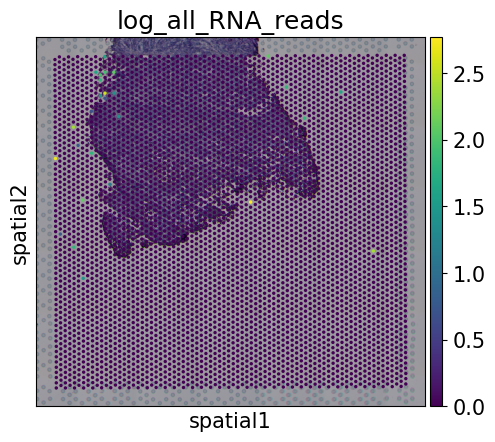

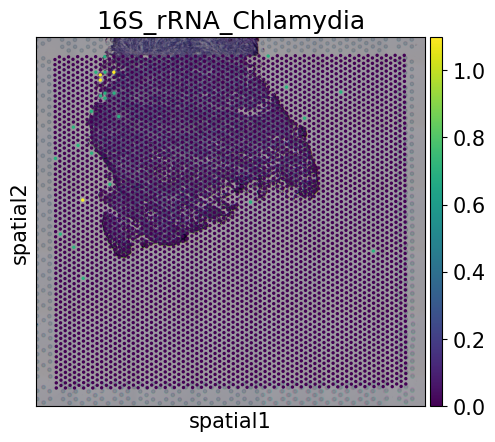

In [15]:
# Save the figure in high resolution
plt.savefig('spatial_plot.png', dpi=300)  # 300 dpi is typically considered high resolution

adata.obs['log_all_RNA_reads'] = np.log1p(adata.obs['all_RNA_reads'])
sc.pl.spatial(adata, color='log_all_RNA_reads')

sc.pl.spatial(adata, color='16S_rRNA_Chlamydia')

tissue_positions_df = pd.read_csv('./28313000_Tumor_16SrRNA/Tumor_tissue_positions_list.csv')

                    in_tissue  array_row  array_col     n_counts  \
AAACAACGAATAGTTC-1          0          0         16    88.436279   
AAACAAGTATCTCCCA-1          0         50        102   275.231110   
AAACAATCTACTAGCA-1          0          3         43   444.373444   
AAACACCAATAACTGC-1          1         59         19  6490.045898   
AAACAGAGCGACTCCT-1          0         14         94   125.238754   

                    all_RNA_reads  mean_num_of_mismatches  mismatch_ratio  \
AAACAACGAATAGTTC-1              0                       0            -1.0   
AAACAAGTATCTCCCA-1              0                       0            -1.0   
AAACAATCTACTAGCA-1              0                       0            -1.0   
AAACACCAATAACTGC-1              0                       0            -1.0   
AAACAGAGCGACTCCT-1              0                       0            -1.0   

                    log_all_RNA_reads  
AAACAACGAATAGTTC-1                0.0  
AAACAAGTATCTCCCA-1                0.0  
AAACAATC

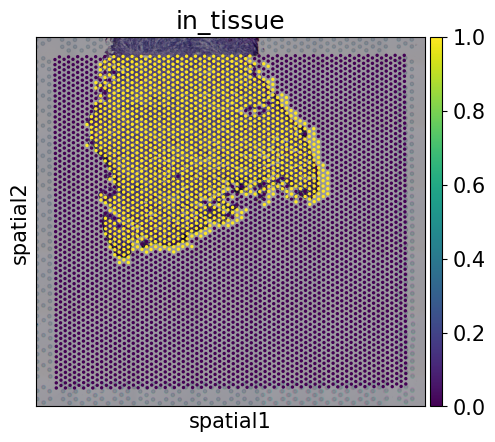

In [16]:
# 'barcode' 컬럼을 인덱스로 설정합니다.
tissue_positions_df.set_index('barcode', inplace=True)

# adata.obs에 'in_tissue' 컬럼을 매핑합니다.
# 이 때, adata.obs의 인덱스와 tissue_positions_df의 인덱스가 정확히 일치하도록 주의합니다.
# adata.obs의 인덱스가 barcode로 구성되어 있고, 알파벳 순서대로 정렬되어 있지 않다면,
# 다음과 같이 직접 매핑할 수 있습니다.
adata.obs['in_tissue'] = adata.obs.index.map(tissue_positions_df['in_tissue'])

# 결과 확인
print(adata.obs.head())

sc.pl.spatial(adata, color = 'in_tissue') 


In [17]:
coords = adata.obs[['array_row', 'array_col']].values
dist_matrix = distance.cdist(coords, coords, 'euclidean')

In [18]:
# in_tissue의 총 합 계산
total_in_tissue = adata.obs['in_tissue'].sum()

# 조건을 만족하는 최소 이웃의 수를 찾기 위한 변수 초기화
min_neighbors = 1
condition_met = False

# 조건을 만족할 때까지 이웃의 수를 증가시키면서 반복
for n_neighbors in range(1, len(adata.obs) + 1):
    # 각 샘플에 대해 n_neighbors 만큼의 가장 가까운 이웃을 찾습니다.
    nearest_neighbors_indices = np.argsort(dist_matrix, axis=1)[:, 1:n_neighbors+1]

    # 새로운 플래그 계산
    new_flag = []
    for idx, neighbors in enumerate(nearest_neighbors_indices):
        # 이웃들의 in_tissue 값 검사
        neighbor_in_tissue = adata.obs.iloc[neighbors]['in_tissue'].values
        # 이웃 중 하나라도 in_tissue가 1이면, 해당 샘플의 플래그를 true로 설정
        new_flag.append(np.any(neighbor_in_tissue == 1))

    # new_flag의 총 합 계산
    total_new_flag = np.sum(new_flag)

    # 조건이 충족되는지 검사
    if total_new_flag >= 1.2 * total_in_tissue:
        min_neighbors = n_neighbors
        condition_met = True
        break

# 결과 출력
if condition_met:
    print(f"최소 이웃의 수: {min_neighbors}, 이 때 new_flag의 총 합은 in_tissue의 1.2 배 이상입니다.")
else:
    print("어떤 이웃의 수에서도 new_flag의 총 합이 in_tissue의 1.2 배를 초과하지 않습니다.")


최소 이웃의 수: 9, 이 때 new_flag의 총 합은 in_tissue의 1.2 배 이상입니다.


In [19]:
from scipy.spatial import distance
import numpy as np

# array_row와 array_col을 기반으로 모든 샘플 간의 거리를 계산합니다.
min_neighbors =9


# 각 샘플에 대해 가장 가까운 3개의 이웃을 찾습니다 (자기 자신을 제외).
# argsort를 사용하여 각 행마다 거리가 가장 짧은 이웃의 인덱스를 얻습니다.
nearest_neighbors_indices = np.argsort(dist_matrix, axis=1)[:, 1:(min_neighbors+1)]

# in_tissue 값을 기반으로 새로운 플래그를 생성합니다.
# 이 플래그는 주어진 샘플이 이웃 중 하나 이상이 in_tissue가 1인 경우 true로 설정됩니다.
new_flag = []
for idx, neighbors in enumerate(nearest_neighbors_indices):
    # 이웃들의 in_tissue 값 검사
    neighbor_in_tissue = adata.obs.iloc[neighbors]['in_tissue'].values
    # 이웃 중 하나라도 in_tissue가 1이면, 해당 샘플의 플래그를 true로 설정
    new_flag.append(np.any(neighbor_in_tissue == 1))

# 새로운 플래그를 adata.obs에 추가
adata.obs['new_flag'] = new_flag

# 결과 확인
print(adata.obs[['array_row', 'array_col', 'in_tissue', 'new_flag']].head())


                    array_row  array_col  in_tissue  new_flag
AAACAACGAATAGTTC-1          0         16          0     False
AAACAAGTATCTCCCA-1         50        102          0     False
AAACAATCTACTAGCA-1          3         43          0     False
AAACACCAATAACTGC-1         59         19          1      True
AAACAGAGCGACTCCT-1         14         94          0     False


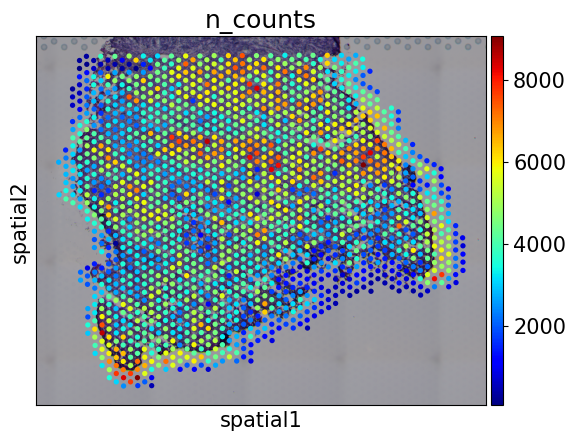

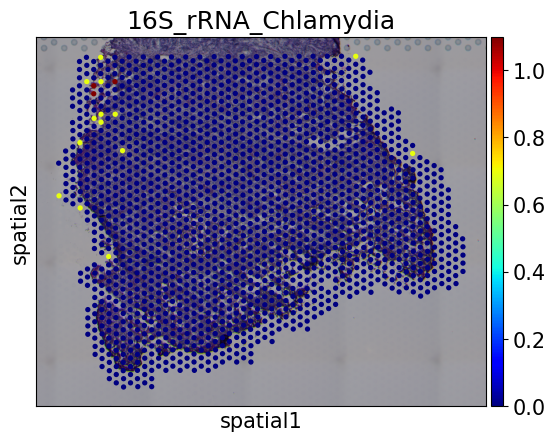

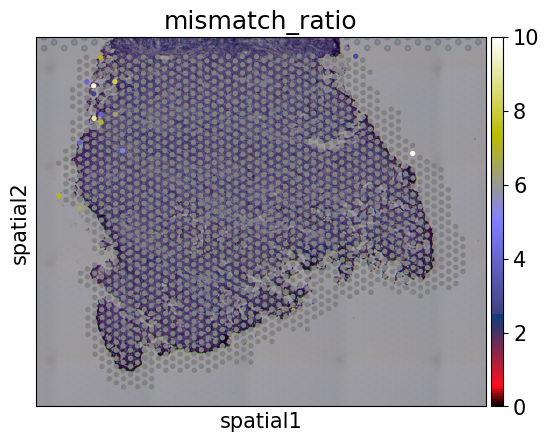

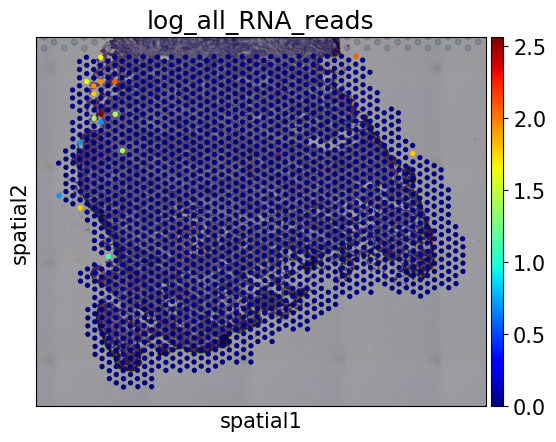

In [20]:
# 선택적으로, spatial plot 생성
# sc.pl.spatial(adata, color='new_flag')

filtered_adata = adata[adata.obs['new_flag'] == True]

sc.pl.spatial(filtered_adata, color = 'n_counts', cmap='jet')

sc.pl.spatial(filtered_adata, color = '16S_rRNA_Chlamydia', cmap='jet')

import matplotlib.pyplot as plt
import scanpy as sc

cmap = plt.cm.gist_stern  # You can choose any other colormap
cmap.set_under('gray')  # Setting the color for -1 values

# Create the plot
sc.pl.spatial(filtered_adata, color='mismatch_ratio', cmap=cmap, vmax = 10, vmin=0, show=False)

# Save the figure in high resolution
plt.savefig('spatial_plot.png', dpi=300)  # 300 dpi is typically considered high resolution

sc.pl.spatial(filtered_adata, color = 'log_all_RNA_reads', cmap='jet')

In [21]:
adata.write('28313000_filtered_adata_240409_chlamidia.h5ad')


/home/seohyepark/yes/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


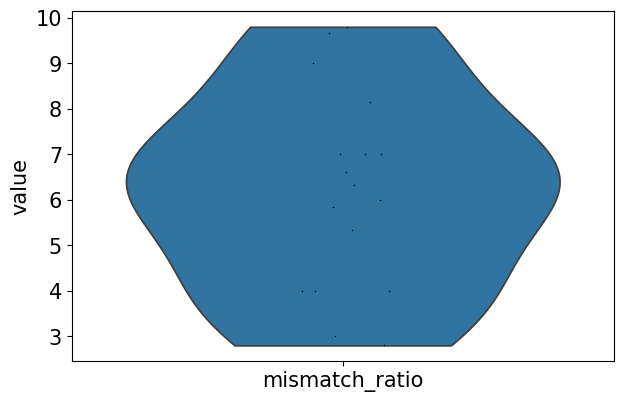

In [22]:
import scanpy as sc

# mismatch_ratio가 -1이 아닌 행만 필터링
filtered_data = filtered_adata[filtered_adata.obs['mismatch_ratio'] != -1].copy()

# 필터링된 데이터로 바이올린 플롯 그리기
sc.pl.violin(filtered_data, keys='mismatch_ratio')


## Escherichia

/home/seohyepark/yes/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/seohyepark/yes/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


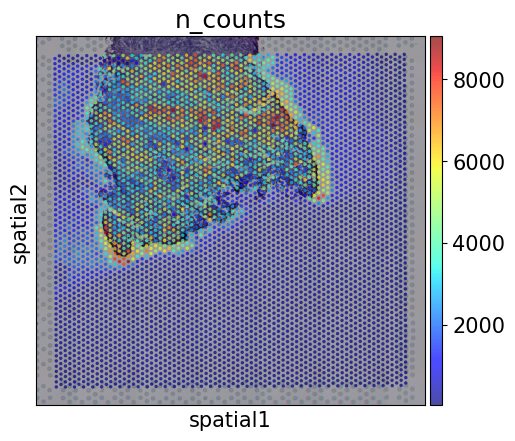

In [23]:
tissue_dir = '/home/seohyepark/portrai-nadim/2831300_Tumor_microbiome/28313000_Tumor_16S_rRNA_Escherichia'
adata = QC(tissue_dir)

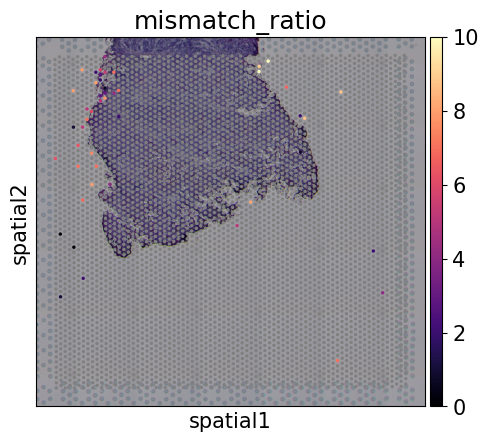

In [24]:
df = pd.read_csv('/home/seohyepark/portrai-nadim/28313000_Tumor_microbiome/barcode_summary_Escherichia.csv', index_col = 0)

adata.obs['all_RNA_reads'] = df['l2']
adata.obs['mean_num_of_mismatches'] = df['l3']

adata.obs['mismatch_ratio'] = adata.obs['mean_num_of_mismatches'] / adata.obs['all_RNA_reads']

adata.obs['mismatch_ratio'].replace([np.inf, -np.inf], np.nan, inplace=True)
adata.obs['mismatch_ratio'].fillna(-1, inplace=True)

cmap = plt.cm.magma# You can choose any other colormap
cmap.set_under('gray')  # Setting the color for -1 values

sc.pl.spatial(adata, color='mismatch_ratio', save = '.png', cmap=cmap,  vmax = 10, vmin=0)

import matplotlib.pyplot as plt
import scanpy as sc

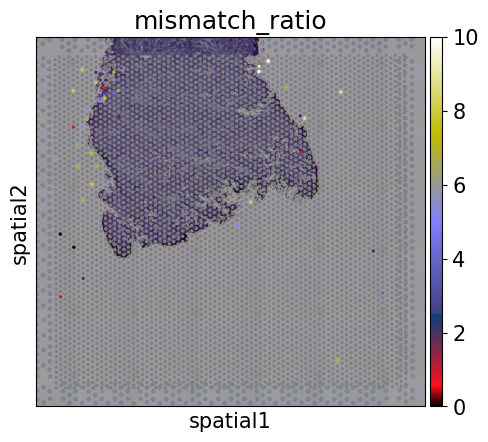

In [25]:
import matplotlib.pyplot as plt
import scanpy as sc

# Your existing code for creating the plot
adata.obs['mismatch_ratio'] = adata.obs['mean_num_of_mismatches'] / adata.obs['all_RNA_reads']
adata.obs['mismatch_ratio'].replace([np.inf, -np.inf], np.nan, inplace=True)
adata.obs['mismatch_ratio'].fillna(-1, inplace=True)

cmap = plt.cm.gist_stern  # You can choose any other colormap
cmap.set_under('gray')  # Setting the color for -1 values

# Create the plot
sc.pl.spatial(adata, color='mismatch_ratio', cmap=cmap, vmax = 10, vmin=0, show=False)

# Save the figure in high resolution
plt.savefig('spatial_plot.png', dpi=300)  # 300 dpi is typically considered high resolution


In [26]:
adata.obs['mismatch_ratio'] = adata.obs['mean_num_of_mismatches'] / adata.obs['all_RNA_reads']
adata.obs['mismatch_ratio'].replace([np.inf, -np.inf], np.nan, inplace=True)
adata.obs['mismatch_ratio'].fillna(-1, inplace=True)

cmap = plt.cm.gist_stern  # You can choose any other colormap
cmap.set_under('gray')  # Setting the color for -1 values

<Figure size 640x480 with 0 Axes>

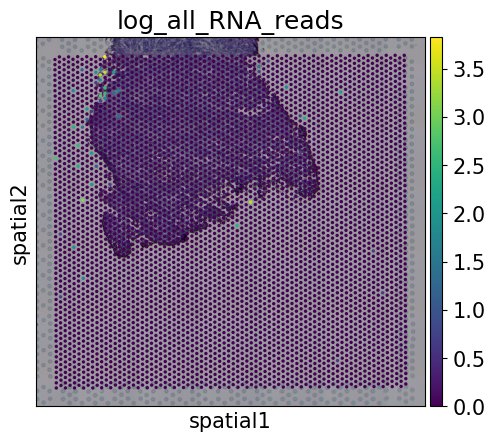

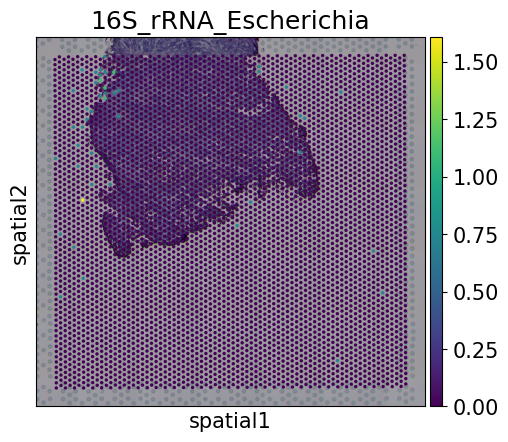

In [27]:
# Save the figure in high resolution
plt.savefig('spatial_plot.png', dpi=300)  # 300 dpi is typically considered high resolution

adata.obs['log_all_RNA_reads'] = np.log1p(adata.obs['all_RNA_reads'])
sc.pl.spatial(adata, color='log_all_RNA_reads')

sc.pl.spatial(adata, color='16S_rRNA_Escherichia')

tissue_positions_df = pd.read_csv('./28313000_Tumor_16SrRNA/Tumor_tissue_positions_list.csv')

                    in_tissue  array_row  array_col     n_counts  \
AAACAACGAATAGTTC-1          0          0         16    88.436279   
AAACAAGTATCTCCCA-1          0         50        102   275.231110   
AAACAATCTACTAGCA-1          0          3         43   444.373444   
AAACACCAATAACTGC-1          1         59         19  6490.045898   
AAACAGAGCGACTCCT-1          0         14         94   125.238754   

                    all_RNA_reads  mean_num_of_mismatches  mismatch_ratio  \
AAACAACGAATAGTTC-1              0                       0            -1.0   
AAACAAGTATCTCCCA-1              0                       0            -1.0   
AAACAATCTACTAGCA-1              0                       0            -1.0   
AAACACCAATAACTGC-1              0                       0            -1.0   
AAACAGAGCGACTCCT-1              0                       0            -1.0   

                    log_all_RNA_reads  
AAACAACGAATAGTTC-1                0.0  
AAACAAGTATCTCCCA-1                0.0  
AAACAATC

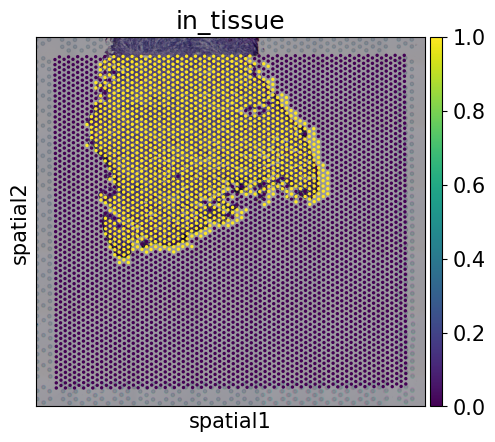

In [28]:
# 'barcode' 컬럼을 인덱스로 설정합니다.
tissue_positions_df.set_index('barcode', inplace=True)

# adata.obs에 'in_tissue' 컬럼을 매핑합니다.
# 이 때, adata.obs의 인덱스와 tissue_positions_df의 인덱스가 정확히 일치하도록 주의합니다.
# adata.obs의 인덱스가 barcode로 구성되어 있고, 알파벳 순서대로 정렬되어 있지 않다면,
# 다음과 같이 직접 매핑할 수 있습니다.
adata.obs['in_tissue'] = adata.obs.index.map(tissue_positions_df['in_tissue'])

# 결과 확인
print(adata.obs.head())

sc.pl.spatial(adata, color = 'in_tissue') 


In [29]:
coords = adata.obs[['array_row', 'array_col']].values
dist_matrix = distance.cdist(coords, coords, 'euclidean')

In [30]:
# in_tissue의 총 합 계산
total_in_tissue = adata.obs['in_tissue'].sum()

# 조건을 만족하는 최소 이웃의 수를 찾기 위한 변수 초기화
min_neighbors = 1
condition_met = False

# 조건을 만족할 때까지 이웃의 수를 증가시키면서 반복
for n_neighbors in range(1, len(adata.obs) + 1):
    # 각 샘플에 대해 n_neighbors 만큼의 가장 가까운 이웃을 찾습니다.
    nearest_neighbors_indices = np.argsort(dist_matrix, axis=1)[:, 1:n_neighbors+1]

    # 새로운 플래그 계산
    new_flag = []
    for idx, neighbors in enumerate(nearest_neighbors_indices):
        # 이웃들의 in_tissue 값 검사
        neighbor_in_tissue = adata.obs.iloc[neighbors]['in_tissue'].values
        # 이웃 중 하나라도 in_tissue가 1이면, 해당 샘플의 플래그를 true로 설정
        new_flag.append(np.any(neighbor_in_tissue == 1))

    # new_flag의 총 합 계산
    total_new_flag = np.sum(new_flag)

    # 조건이 충족되는지 검사
    if total_new_flag >= 1.2 * total_in_tissue:
        min_neighbors = n_neighbors
        condition_met = True
        break

# 결과 출력
if condition_met:
    print(f"최소 이웃의 수: {min_neighbors}, 이 때 new_flag의 총 합은 in_tissue의 1.2 배 이상입니다.")
else:
    print("어떤 이웃의 수에서도 new_flag의 총 합이 in_tissue의 1.2 배를 초과하지 않습니다.")


최소 이웃의 수: 9, 이 때 new_flag의 총 합은 in_tissue의 1.2 배 이상입니다.


In [31]:
from scipy.spatial import distance
import numpy as np

# array_row와 array_col을 기반으로 모든 샘플 간의 거리를 계산합니다.
min_neighbors =9


# 각 샘플에 대해 가장 가까운 3개의 이웃을 찾습니다 (자기 자신을 제외).
# argsort를 사용하여 각 행마다 거리가 가장 짧은 이웃의 인덱스를 얻습니다.
nearest_neighbors_indices = np.argsort(dist_matrix, axis=1)[:, 1:(min_neighbors+1)]

# in_tissue 값을 기반으로 새로운 플래그를 생성합니다.
# 이 플래그는 주어진 샘플이 이웃 중 하나 이상이 in_tissue가 1인 경우 true로 설정됩니다.
new_flag = []
for idx, neighbors in enumerate(nearest_neighbors_indices):
    # 이웃들의 in_tissue 값 검사
    neighbor_in_tissue = adata.obs.iloc[neighbors]['in_tissue'].values
    # 이웃 중 하나라도 in_tissue가 1이면, 해당 샘플의 플래그를 true로 설정
    new_flag.append(np.any(neighbor_in_tissue == 1))

# 새로운 플래그를 adata.obs에 추가
adata.obs['new_flag'] = new_flag

# 결과 확인
print(adata.obs[['array_row', 'array_col', 'in_tissue', 'new_flag']].head())


                    array_row  array_col  in_tissue  new_flag
AAACAACGAATAGTTC-1          0         16          0     False
AAACAAGTATCTCCCA-1         50        102          0     False
AAACAATCTACTAGCA-1          3         43          0     False
AAACACCAATAACTGC-1         59         19          1      True
AAACAGAGCGACTCCT-1         14         94          0     False


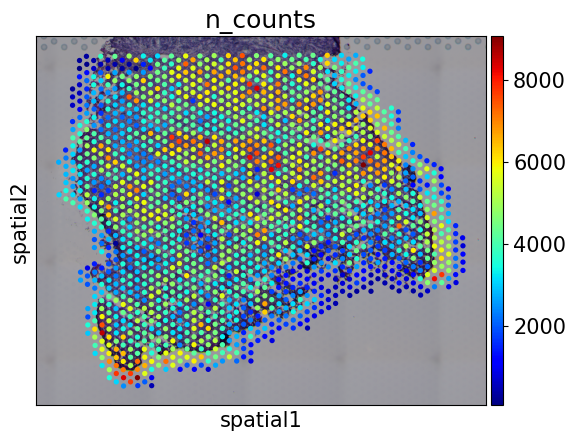

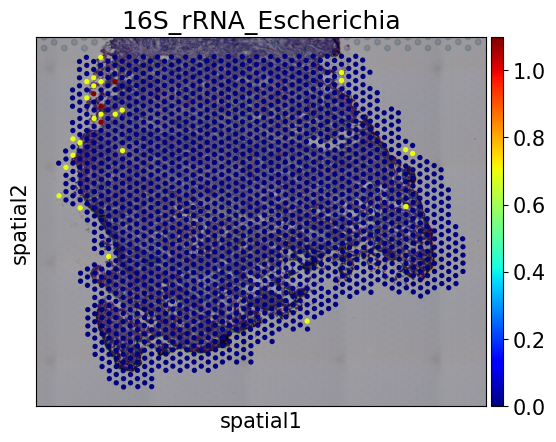

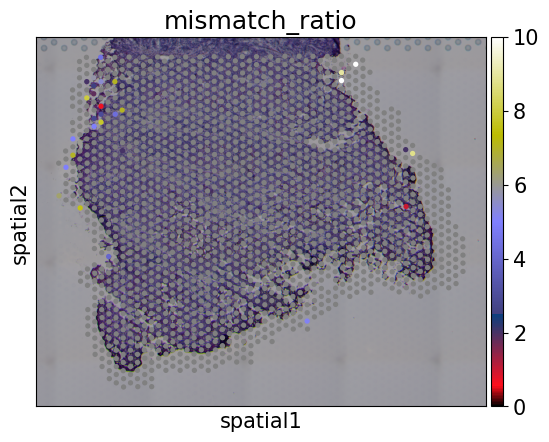

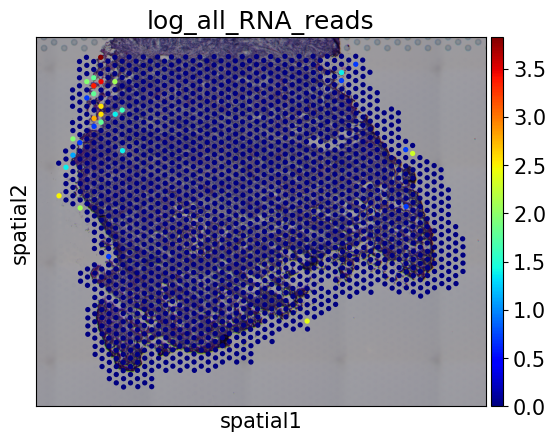

In [33]:
# 선택적으로, spatial plot 생성
# sc.pl.spatial(adata, color='new_flag')

filtered_adata = adata[adata.obs['new_flag'] == True]

sc.pl.spatial(filtered_adata, color = 'n_counts', cmap='jet')

sc.pl.spatial(filtered_adata, color = '16S_rRNA_Escherichia', cmap='jet')

import matplotlib.pyplot as plt
import scanpy as sc

cmap = plt.cm.gist_stern  # You can choose any other colormap
cmap.set_under('gray')  # Setting the color for -1 values

# Create the plot
sc.pl.spatial(filtered_adata, color='mismatch_ratio', cmap=cmap, vmax = 10, vmin=0, show=False)

# Save the figure in high resolution
plt.savefig('spatial_plot.png', dpi=300)  # 300 dpi is typically considered high resolution

sc.pl.spatial(filtered_adata, color = 'log_all_RNA_reads', cmap='jet')

In [34]:
adata.write('28313000_filtered_adata_240409_escherichia.h5ad')


/home/seohyepark/yes/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


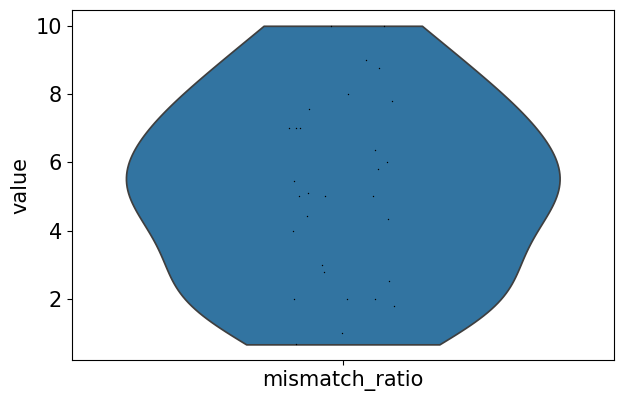

In [35]:
import scanpy as sc

# mismatch_ratio가 -1이 아닌 행만 필터링
filtered_data = filtered_adata[filtered_adata.obs['mismatch_ratio'] != -1].copy()

# 필터링된 데이터로 바이올린 플롯 그리기
sc.pl.violin(filtered_data, keys='mismatch_ratio')


## Staphilococcus

/home/seohyepark/yes/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/seohyepark/yes/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


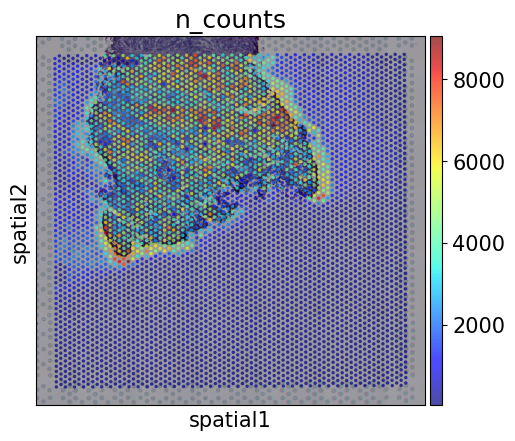

In [36]:
tissue_dir = '/home/seohyepark/portrai-nadim/2831300_Tumor_microbiome/28313000_Tumor_16S_rRNA_Staphilococcus'
adata = QC(tissue_dir)

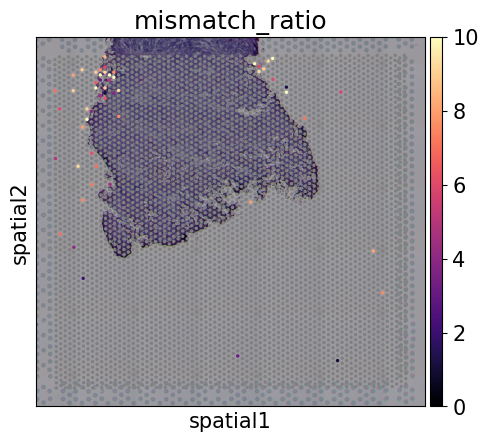

In [37]:
df = pd.read_csv('/home/seohyepark/portrai-nadim/28313000_Tumor_microbiome/barcode_summary_Staphilococcus.csv', index_col = 0)

adata.obs['all_RNA_reads'] = df['l2']
adata.obs['mean_num_of_mismatches'] = df['l3']

adata.obs['mismatch_ratio'] = adata.obs['mean_num_of_mismatches'] / adata.obs['all_RNA_reads']

adata.obs['mismatch_ratio'].replace([np.inf, -np.inf], np.nan, inplace=True)
adata.obs['mismatch_ratio'].fillna(-1, inplace=True)

cmap = plt.cm.magma# You can choose any other colormap
cmap.set_under('gray')  # Setting the color for -1 values

sc.pl.spatial(adata, color='mismatch_ratio', save = '.png', cmap=cmap,  vmax = 10, vmin=0)

import matplotlib.pyplot as plt
import scanpy as sc

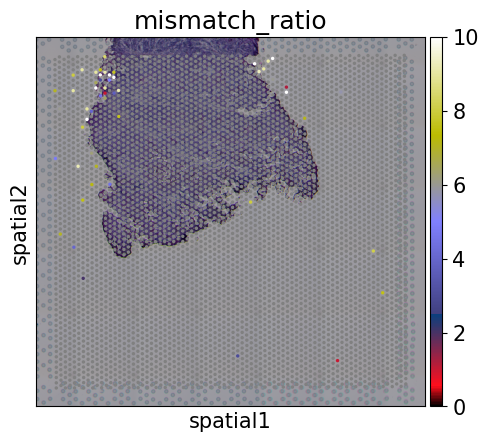

In [38]:
import matplotlib.pyplot as plt
import scanpy as sc

# Your existing code for creating the plot
adata.obs['mismatch_ratio'] = adata.obs['mean_num_of_mismatches'] / adata.obs['all_RNA_reads']
adata.obs['mismatch_ratio'].replace([np.inf, -np.inf], np.nan, inplace=True)
adata.obs['mismatch_ratio'].fillna(-1, inplace=True)

cmap = plt.cm.gist_stern  # You can choose any other colormap
cmap.set_under('gray')  # Setting the color for -1 values

# Create the plot
sc.pl.spatial(adata, color='mismatch_ratio', cmap=cmap, vmax = 10, vmin=0, show=False)

# Save the figure in high resolution
plt.savefig('spatial_plot.png', dpi=300)  # 300 dpi is typically considered high resolution


In [39]:
adata.obs['mismatch_ratio'] = adata.obs['mean_num_of_mismatches'] / adata.obs['all_RNA_reads']
adata.obs['mismatch_ratio'].replace([np.inf, -np.inf], np.nan, inplace=True)
adata.obs['mismatch_ratio'].fillna(-1, inplace=True)

cmap = plt.cm.gist_stern  # You can choose any other colormap
cmap.set_under('gray')  # Setting the color for -1 values

<Figure size 640x480 with 0 Axes>

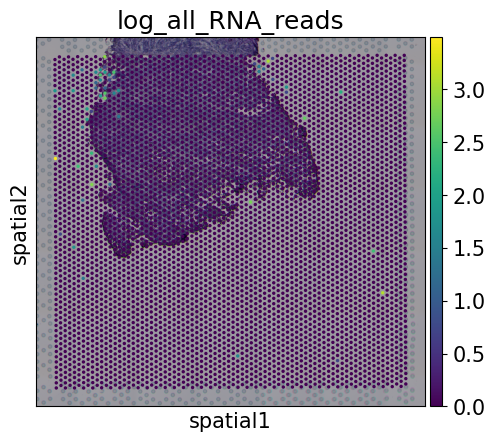

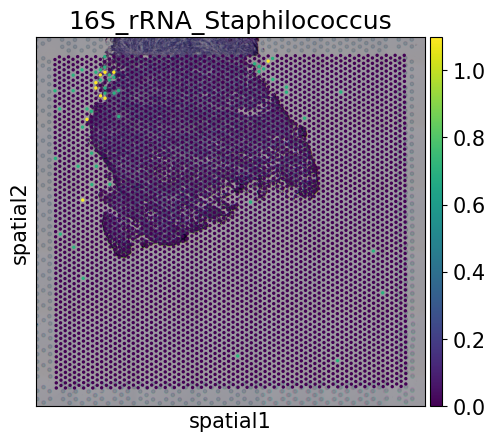

In [40]:
# Save the figure in high resolution
plt.savefig('spatial_plot.png', dpi=300)  # 300 dpi is typically considered high resolution

adata.obs['log_all_RNA_reads'] = np.log1p(adata.obs['all_RNA_reads'])
sc.pl.spatial(adata, color='log_all_RNA_reads')

sc.pl.spatial(adata, color='16S_rRNA_Staphilococcus')

tissue_positions_df = pd.read_csv('./28313000_Tumor_16SrRNA/Tumor_tissue_positions_list.csv')

                    in_tissue  array_row  array_col     n_counts  \
AAACAACGAATAGTTC-1          0          0         16    88.436279   
AAACAAGTATCTCCCA-1          0         50        102   275.231110   
AAACAATCTACTAGCA-1          0          3         43   444.373444   
AAACACCAATAACTGC-1          1         59         19  6490.045898   
AAACAGAGCGACTCCT-1          0         14         94   125.238754   

                    all_RNA_reads  mean_num_of_mismatches  mismatch_ratio  \
AAACAACGAATAGTTC-1              0                       0            -1.0   
AAACAAGTATCTCCCA-1              0                       0            -1.0   
AAACAATCTACTAGCA-1              0                       0            -1.0   
AAACACCAATAACTGC-1              0                       0            -1.0   
AAACAGAGCGACTCCT-1              0                       0            -1.0   

                    log_all_RNA_reads  
AAACAACGAATAGTTC-1                0.0  
AAACAAGTATCTCCCA-1                0.0  
AAACAATC

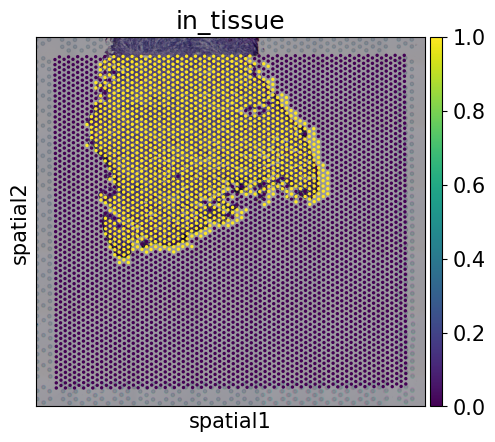

In [41]:
# 'barcode' 컬럼을 인덱스로 설정합니다.
tissue_positions_df.set_index('barcode', inplace=True)

# adata.obs에 'in_tissue' 컬럼을 매핑합니다.
# 이 때, adata.obs의 인덱스와 tissue_positions_df의 인덱스가 정확히 일치하도록 주의합니다.
# adata.obs의 인덱스가 barcode로 구성되어 있고, 알파벳 순서대로 정렬되어 있지 않다면,
# 다음과 같이 직접 매핑할 수 있습니다.
adata.obs['in_tissue'] = adata.obs.index.map(tissue_positions_df['in_tissue'])

# 결과 확인
print(adata.obs.head())

sc.pl.spatial(adata, color = 'in_tissue') 


In [42]:
coords = adata.obs[['array_row', 'array_col']].values
dist_matrix = distance.cdist(coords, coords, 'euclidean')

In [43]:
# in_tissue의 총 합 계산
total_in_tissue = adata.obs['in_tissue'].sum()

# 조건을 만족하는 최소 이웃의 수를 찾기 위한 변수 초기화
min_neighbors = 1
condition_met = False

# 조건을 만족할 때까지 이웃의 수를 증가시키면서 반복
for n_neighbors in range(1, len(adata.obs) + 1):
    # 각 샘플에 대해 n_neighbors 만큼의 가장 가까운 이웃을 찾습니다.
    nearest_neighbors_indices = np.argsort(dist_matrix, axis=1)[:, 1:n_neighbors+1]

    # 새로운 플래그 계산
    new_flag = []
    for idx, neighbors in enumerate(nearest_neighbors_indices):
        # 이웃들의 in_tissue 값 검사
        neighbor_in_tissue = adata.obs.iloc[neighbors]['in_tissue'].values
        # 이웃 중 하나라도 in_tissue가 1이면, 해당 샘플의 플래그를 true로 설정
        new_flag.append(np.any(neighbor_in_tissue == 1))

    # new_flag의 총 합 계산
    total_new_flag = np.sum(new_flag)

    # 조건이 충족되는지 검사
    if total_new_flag >= 1.2 * total_in_tissue:
        min_neighbors = n_neighbors
        condition_met = True
        break

# 결과 출력
if condition_met:
    print(f"최소 이웃의 수: {min_neighbors}, 이 때 new_flag의 총 합은 in_tissue의 1.2 배 이상입니다.")
else:
    print("어떤 이웃의 수에서도 new_flag의 총 합이 in_tissue의 1.2 배를 초과하지 않습니다.")


최소 이웃의 수: 9, 이 때 new_flag의 총 합은 in_tissue의 1.2 배 이상입니다.


In [44]:
from scipy.spatial import distance
import numpy as np

# array_row와 array_col을 기반으로 모든 샘플 간의 거리를 계산합니다.
min_neighbors =9


# 각 샘플에 대해 가장 가까운 3개의 이웃을 찾습니다 (자기 자신을 제외).
# argsort를 사용하여 각 행마다 거리가 가장 짧은 이웃의 인덱스를 얻습니다.
nearest_neighbors_indices = np.argsort(dist_matrix, axis=1)[:, 1:(min_neighbors+1)]

# in_tissue 값을 기반으로 새로운 플래그를 생성합니다.
# 이 플래그는 주어진 샘플이 이웃 중 하나 이상이 in_tissue가 1인 경우 true로 설정됩니다.
new_flag = []
for idx, neighbors in enumerate(nearest_neighbors_indices):
    # 이웃들의 in_tissue 값 검사
    neighbor_in_tissue = adata.obs.iloc[neighbors]['in_tissue'].values
    # 이웃 중 하나라도 in_tissue가 1이면, 해당 샘플의 플래그를 true로 설정
    new_flag.append(np.any(neighbor_in_tissue == 1))

# 새로운 플래그를 adata.obs에 추가
adata.obs['new_flag'] = new_flag

# 결과 확인
print(adata.obs[['array_row', 'array_col', 'in_tissue', 'new_flag']].head())


                    array_row  array_col  in_tissue  new_flag
AAACAACGAATAGTTC-1          0         16          0     False
AAACAAGTATCTCCCA-1         50        102          0     False
AAACAATCTACTAGCA-1          3         43          0     False
AAACACCAATAACTGC-1         59         19          1      True
AAACAGAGCGACTCCT-1         14         94          0     False


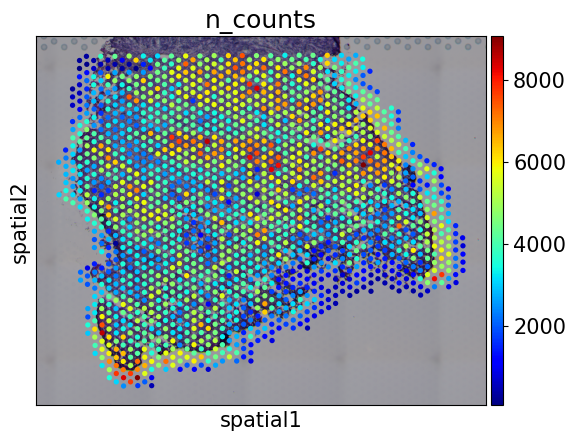

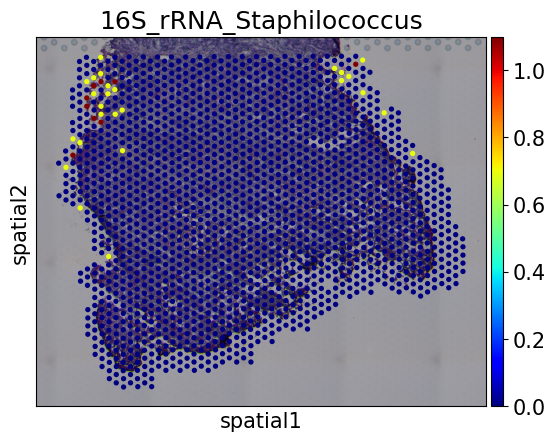

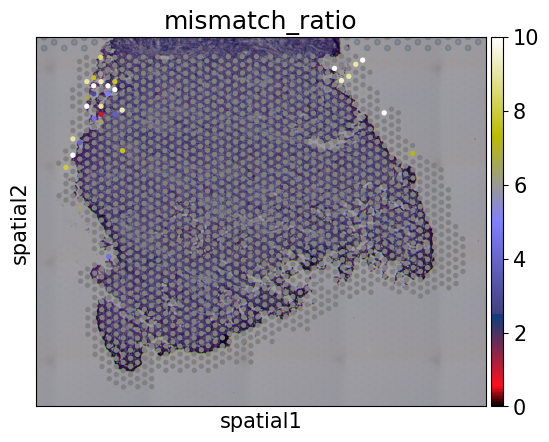

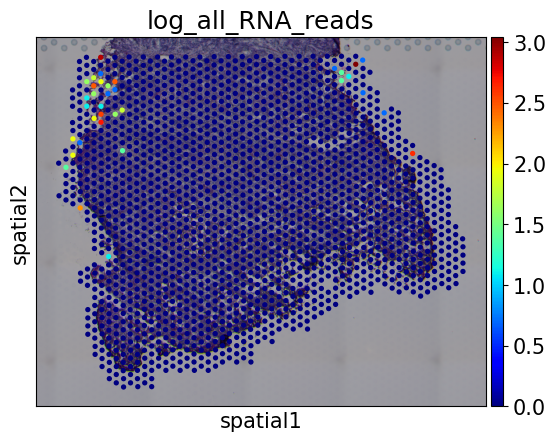

In [45]:
# 선택적으로, spatial plot 생성
# sc.pl.spatial(adata, color='new_flag')

filtered_adata = adata[adata.obs['new_flag'] == True]

sc.pl.spatial(filtered_adata, color = 'n_counts', cmap='jet')

sc.pl.spatial(filtered_adata, color = '16S_rRNA_Staphilococcus', cmap='jet')

import matplotlib.pyplot as plt
import scanpy as sc

cmap = plt.cm.gist_stern  # You can choose any other colormap
cmap.set_under('gray')  # Setting the color for -1 values

# Create the plot
sc.pl.spatial(filtered_adata, color='mismatch_ratio', cmap=cmap, vmax = 10, vmin=0, show=False)

# Save the figure in high resolution
plt.savefig('spatial_plot.png', dpi=300)  # 300 dpi is typically considered high resolution

sc.pl.spatial(filtered_adata, color = 'log_all_RNA_reads', cmap='jet')

In [46]:
adata.write('28313000_filtered_adata_240409_staphilococcus.h5ad')


/home/seohyepark/yes/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


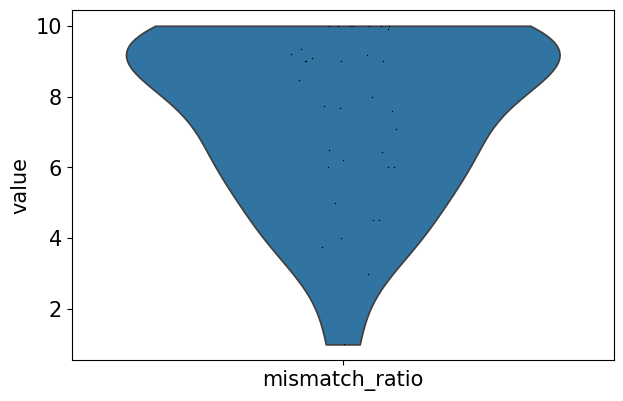

In [47]:
import scanpy as sc

# mismatch_ratio가 -1이 아닌 행만 필터링
filtered_data = filtered_adata[filtered_adata.obs['mismatch_ratio'] != -1].copy()

# 필터링된 데이터로 바이올린 플롯 그리기
sc.pl.violin(filtered_data, keys='mismatch_ratio')


## Staphylococcus

/home/seohyepark/yes/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/seohyepark/yes/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


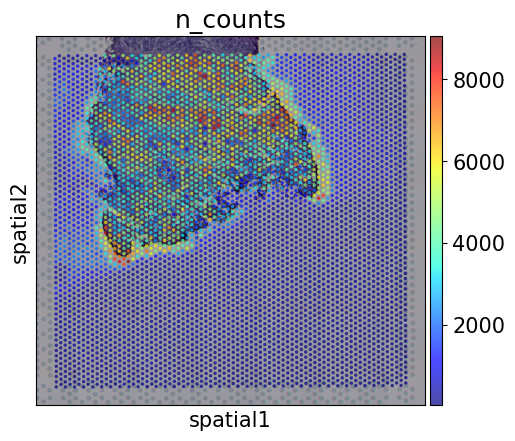

In [48]:
tissue_dir = '/home/seohyepark/portrai-nadim/2831300_Tumor_microbiome/28313000_Tumor_16S_rRNA_Staphylococcus'
adata = QC(tissue_dir)

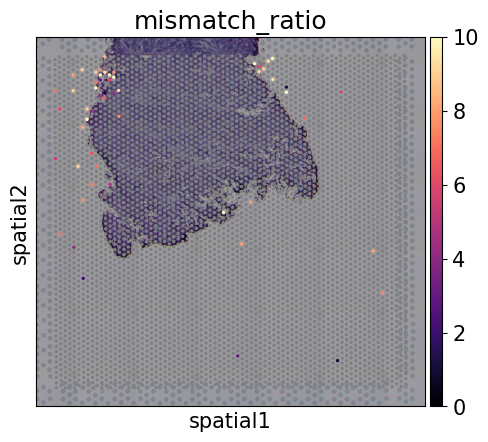

In [54]:
df = pd.read_csv('/home/seohyepark/portrai-nadim/28313000_Tumor_microbiome/barcode_summary_Staphylococcus.csv', index_col = 0)

adata.obs['all_RNA_reads'] = df['l2']
adata.obs['mean_num_of_mismatches'] = df['l3']

adata.obs['mismatch_ratio'] = adata.obs['mean_num_of_mismatches'] / adata.obs['all_RNA_reads']

adata.obs['mismatch_ratio'].replace([np.inf, -np.inf], np.nan, inplace=True)
adata.obs['mismatch_ratio'].fillna(-1, inplace=True)

cmap = plt.cm.magma# You can choose any other colormap
cmap.set_under('gray')  # Setting the color for -1 values

sc.pl.spatial(adata, color='mismatch_ratio', save = '.png', cmap=cmap,  vmax = 10, vmin=0)

import matplotlib.pyplot as plt
import scanpy as sc

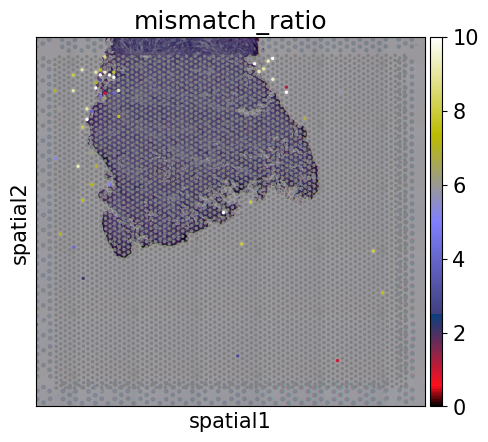

In [55]:
import matplotlib.pyplot as plt
import scanpy as sc

# Your existing code for creating the plot
adata.obs['mismatch_ratio'] = adata.obs['mean_num_of_mismatches'] / adata.obs['all_RNA_reads']
adata.obs['mismatch_ratio'].replace([np.inf, -np.inf], np.nan, inplace=True)
adata.obs['mismatch_ratio'].fillna(-1, inplace=True)

cmap = plt.cm.gist_stern  # You can choose any other colormap
cmap.set_under('gray')  # Setting the color for -1 values

# Create the plot
sc.pl.spatial(adata, color='mismatch_ratio', cmap=cmap, vmax = 10, vmin=0, show=False)

# Save the figure in high resolution
plt.savefig('spatial_plot.png', dpi=300)  # 300 dpi is typically considered high resolution


In [56]:
adata.obs['mismatch_ratio'] = adata.obs['mean_num_of_mismatches'] / adata.obs['all_RNA_reads']
adata.obs['mismatch_ratio'].replace([np.inf, -np.inf], np.nan, inplace=True)
adata.obs['mismatch_ratio'].fillna(-1, inplace=True)

cmap = plt.cm.gist_stern  # You can choose any other colormap
cmap.set_under('gray')  # Setting the color for -1 values

<Figure size 640x480 with 0 Axes>

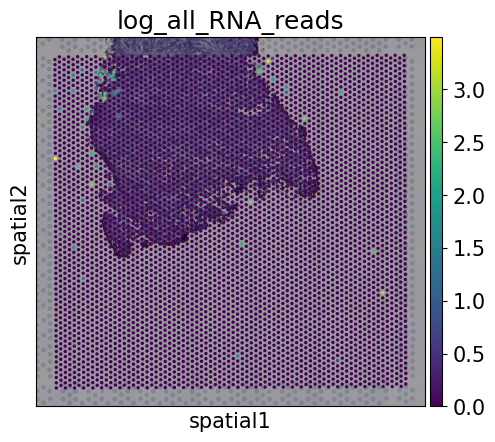

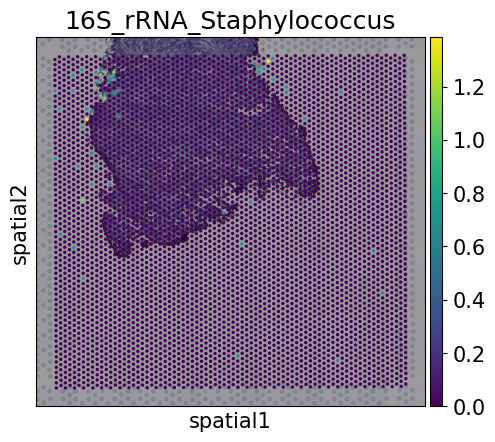

In [57]:
# Save the figure in high resolution
plt.savefig('spatial_plot.png', dpi=300)  # 300 dpi is typically considered high resolution

adata.obs['log_all_RNA_reads'] = np.log1p(adata.obs['all_RNA_reads'])
sc.pl.spatial(adata, color='log_all_RNA_reads')

sc.pl.spatial(adata, color='16S_rRNA_Staphylococcus')

tissue_positions_df = pd.read_csv('./28313000_Tumor_16SrRNA/Tumor_tissue_positions_list.csv')

                    in_tissue  array_row  array_col     n_counts  \
AAACAACGAATAGTTC-1          0          0         16    88.436279   
AAACAAGTATCTCCCA-1          0         50        102   275.231110   
AAACAATCTACTAGCA-1          0          3         43   444.373444   
AAACACCAATAACTGC-1          1         59         19  6490.045898   
AAACAGAGCGACTCCT-1          0         14         94   125.238754   

                    all_RNA_reads  mean_num_of_mismatches  mismatch_ratio  \
AAACAACGAATAGTTC-1              0                       0            -1.0   
AAACAAGTATCTCCCA-1              0                       0            -1.0   
AAACAATCTACTAGCA-1              0                       0            -1.0   
AAACACCAATAACTGC-1              0                       0            -1.0   
AAACAGAGCGACTCCT-1              0                       0            -1.0   

                    log_all_RNA_reads  
AAACAACGAATAGTTC-1                0.0  
AAACAAGTATCTCCCA-1                0.0  
AAACAATC

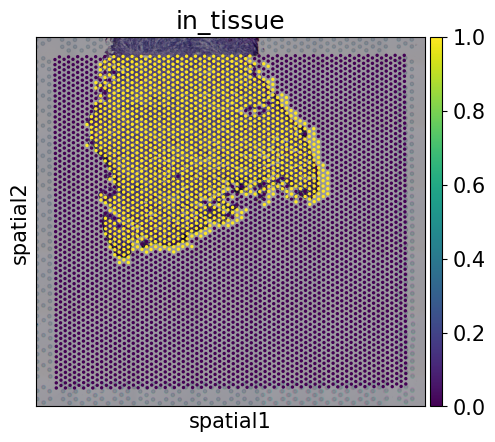

In [58]:
# 'barcode' 컬럼을 인덱스로 설정합니다.
tissue_positions_df.set_index('barcode', inplace=True)

# adata.obs에 'in_tissue' 컬럼을 매핑합니다.
# 이 때, adata.obs의 인덱스와 tissue_positions_df의 인덱스가 정확히 일치하도록 주의합니다.
# adata.obs의 인덱스가 barcode로 구성되어 있고, 알파벳 순서대로 정렬되어 있지 않다면,
# 다음과 같이 직접 매핑할 수 있습니다.
adata.obs['in_tissue'] = adata.obs.index.map(tissue_positions_df['in_tissue'])

# 결과 확인
print(adata.obs.head())

sc.pl.spatial(adata, color = 'in_tissue') 


In [59]:
coords = adata.obs[['array_row', 'array_col']].values
dist_matrix = distance.cdist(coords, coords, 'euclidean')

In [60]:
# in_tissue의 총 합 계산
total_in_tissue = adata.obs['in_tissue'].sum()

# 조건을 만족하는 최소 이웃의 수를 찾기 위한 변수 초기화
min_neighbors = 1
condition_met = False

# 조건을 만족할 때까지 이웃의 수를 증가시키면서 반복
for n_neighbors in range(1, len(adata.obs) + 1):
    # 각 샘플에 대해 n_neighbors 만큼의 가장 가까운 이웃을 찾습니다.
    nearest_neighbors_indices = np.argsort(dist_matrix, axis=1)[:, 1:n_neighbors+1]

    # 새로운 플래그 계산
    new_flag = []
    for idx, neighbors in enumerate(nearest_neighbors_indices):
        # 이웃들의 in_tissue 값 검사
        neighbor_in_tissue = adata.obs.iloc[neighbors]['in_tissue'].values
        # 이웃 중 하나라도 in_tissue가 1이면, 해당 샘플의 플래그를 true로 설정
        new_flag.append(np.any(neighbor_in_tissue == 1))

    # new_flag의 총 합 계산
    total_new_flag = np.sum(new_flag)

    # 조건이 충족되는지 검사
    if total_new_flag >= 1.2 * total_in_tissue:
        min_neighbors = n_neighbors
        condition_met = True
        break

# 결과 출력
if condition_met:
    print(f"최소 이웃의 수: {min_neighbors}, 이 때 new_flag의 총 합은 in_tissue의 1.2 배 이상입니다.")
else:
    print("어떤 이웃의 수에서도 new_flag의 총 합이 in_tissue의 1.2 배를 초과하지 않습니다.")


최소 이웃의 수: 9, 이 때 new_flag의 총 합은 in_tissue의 1.2 배 이상입니다.


In [61]:
from scipy.spatial import distance
import numpy as np

# array_row와 array_col을 기반으로 모든 샘플 간의 거리를 계산합니다.
min_neighbors =9


# 각 샘플에 대해 가장 가까운 3개의 이웃을 찾습니다 (자기 자신을 제외).
# argsort를 사용하여 각 행마다 거리가 가장 짧은 이웃의 인덱스를 얻습니다.
nearest_neighbors_indices = np.argsort(dist_matrix, axis=1)[:, 1:(min_neighbors+1)]

# in_tissue 값을 기반으로 새로운 플래그를 생성합니다.
# 이 플래그는 주어진 샘플이 이웃 중 하나 이상이 in_tissue가 1인 경우 true로 설정됩니다.
new_flag = []
for idx, neighbors in enumerate(nearest_neighbors_indices):
    # 이웃들의 in_tissue 값 검사
    neighbor_in_tissue = adata.obs.iloc[neighbors]['in_tissue'].values
    # 이웃 중 하나라도 in_tissue가 1이면, 해당 샘플의 플래그를 true로 설정
    new_flag.append(np.any(neighbor_in_tissue == 1))

# 새로운 플래그를 adata.obs에 추가
adata.obs['new_flag'] = new_flag

# 결과 확인
print(adata.obs[['array_row', 'array_col', 'in_tissue', 'new_flag']].head())


                    array_row  array_col  in_tissue  new_flag
AAACAACGAATAGTTC-1          0         16          0     False
AAACAAGTATCTCCCA-1         50        102          0     False
AAACAATCTACTAGCA-1          3         43          0     False
AAACACCAATAACTGC-1         59         19          1      True
AAACAGAGCGACTCCT-1         14         94          0     False


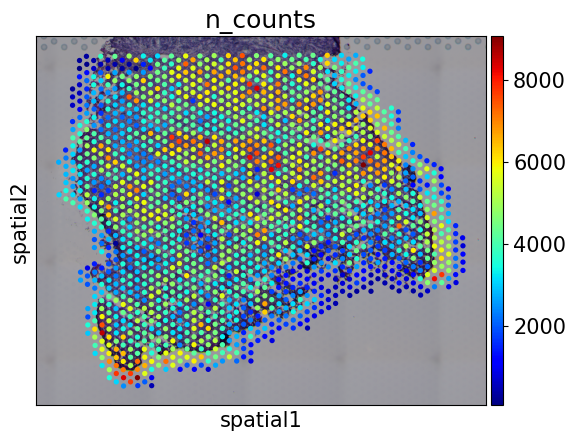

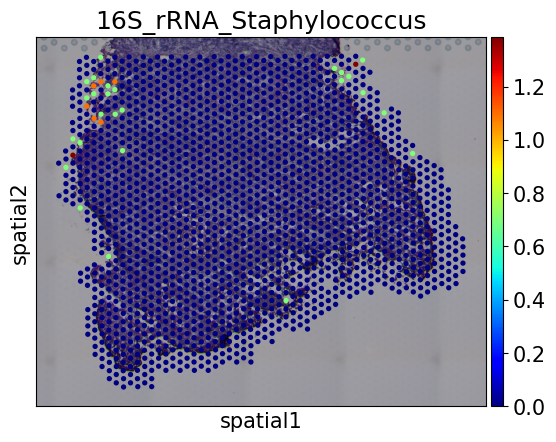

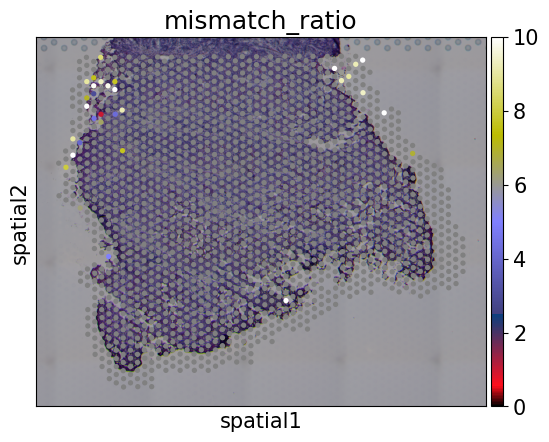

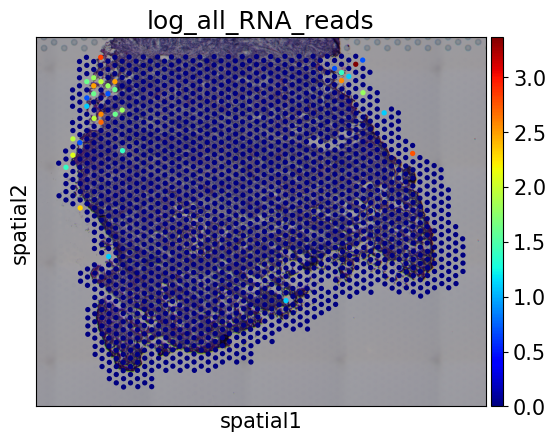

In [62]:
# 선택적으로, spatial plot 생성
# sc.pl.spatial(adata, color='new_flag')

filtered_adata = adata[adata.obs['new_flag'] == True]

sc.pl.spatial(filtered_adata, color = 'n_counts', cmap='jet')

sc.pl.spatial(filtered_adata, color = '16S_rRNA_Staphylococcus', cmap='jet')

import matplotlib.pyplot as plt
import scanpy as sc

cmap = plt.cm.gist_stern  # You can choose any other colormap
cmap.set_under('gray')  # Setting the color for -1 values

# Create the plot
sc.pl.spatial(filtered_adata, color='mismatch_ratio', cmap=cmap, vmax = 10, vmin=0, show=False)

# Save the figure in high resolution
plt.savefig('spatial_plot.png', dpi=300)  # 300 dpi is typically considered high resolution

sc.pl.spatial(filtered_adata, color = 'log_all_RNA_reads', cmap='jet')

In [63]:
adata.write('28313000_filtered_adata_240409_staphylococcus.h5ad')


/home/seohyepark/yes/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


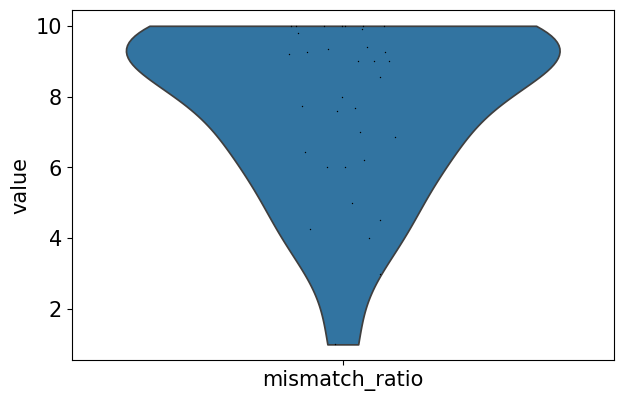

In [64]:
import scanpy as sc

# mismatch_ratio가 -1이 아닌 행만 필터링
filtered_data = filtered_adata[filtered_adata.obs['mismatch_ratio'] != -1].copy()

# 필터링된 데이터로 바이올린 플롯 그리기
sc.pl.violin(filtered_data, keys='mismatch_ratio')
